In [1]:
import boto3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import joblib
import json
from datetime import datetime
import joblib
import boto3
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from typing import Dict, Tuple, Any
import warnings
warnings.filterwarnings('ignore')

/home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
plt.style.use('default')
sns.set_palette("husl")

print("Starting Big Data Mental Health Analytics Pipeline")

Starting Big Data Mental Health Analytics Pipeline


In [3]:
import pandas as pd
import numpy as np


def load_and_process_dataset():
    """Load and perform initial big data processing on mental health dataset"""
    
    print("LOADING DATASET...")
    
    # Option 1: From S3 directly
    try:
        df = pd.read_csv('s3://dataset-gtd/dataset/Mental Health Dataset.csv')
        print(f" Loaded from S3: {len(df)} records")
    except:
        # Option 2: From local file if S3 fails
        try:
            df = pd.read_csv('mental_health_data.csv')  # Adjust filename
            print(f" Loaded locally: {len(df)} records")
        except:
            # Option 3: Create sample data for demo
            print(" Creating sample data for demonstration...")
            df = create_sample_data()
    
    print(f"Dataset shape: {df.shape}")
    print(f"Columns: {list(df.columns)}")
    
    # Big Data Processing: Clean and transform
    print("\n🔧 PERFORMING BIG DATA TRANSFORMATIONS...")
    
    # Standardize column names
    df.columns = df.columns.str.lower().str.replace(' ', '_').str.replace('__', '_')
    
    # Advanced feature engineering (simulates big data processing)
    processed_df = df.copy()
    
    # Encode categorical variables with better handling
    categorical_mappings = {
        'gender': {'Female': 1, 'Male': 0},
        'self_employed': {'Yes': 1, 'No': 0},
        'family_history': {'Yes': 1, 'No': 0},
        'treatment': {'Yes': 1, 'No': 0},
        'growing_stress': {'Yes': 1, 'No': 0},
        'mental_health_history': {'Yes': 1, 'No': 0},
        'social_weakness': {'Yes': 1, 'No': 0},
        'work_interest': {'No': 1, 'Yes': 0},  # Reversed: No interest = 1
        'care_options': {'Yes': 1, 'No': 0, 'Not sure': 0.5},
        'coping_struggles': {'Yes': 1, 'No': 0},
        'changes_habits': {'Yes': 1, 'No': 0},
        'mental_health_interview': {'Yes': 1, 'No': 0}
    }
    
    # Apply encodings with error handling
    for col, mapping in categorical_mappings.items():
        if col in processed_df.columns:
            # Clean the column first
            processed_df[col] = processed_df[col].astype(str).str.strip()
            processed_df[f'{col}_encoded'] = processed_df[col].map(mapping).fillna(0)
            print(f"Encoded {col}: {processed_df[f'{col}_encoded'].value_counts().to_dict()}")
    
    # Create risk score with vectorized operations for better performance
    print("\n CALCULATING RISK SCORES...")
    processed_df['risk_score'] = calculate_risk_scores_vectorized(processed_df)
    
    # Create risk categories
    processed_df['risk_category'] = pd.cut(
        processed_df['risk_score'], 
        bins=[-1, 3, 6, 9, 15], 
        labels=['Low', 'Medium', 'High', 'Critical']
    )
    
    # Add additional analytics features
    processed_df = add_advanced_features(processed_df)
    
    print(f" Dataset processed: {len(processed_df)} records with {processed_df.shape[1]} features")
    print(f"Risk distribution: {processed_df['risk_category'].value_counts().to_dict()}")
    
    return processed_df

def calculate_risk_scores_vectorized(df: pd.DataFrame) -> pd.Series:
    """Calculate risk scores using vectorized operations for better performance"""
    
    # Initialize risk score
    risk_score = pd.Series(0, index=df.index)
    
    # Family history (high weight)
    risk_score += df.get('family_history_encoded', 0) * 3
    
    # Current mental health status
    risk_score += df.get('mental_health_history_encoded', 0) * 2
    
    # Stress indicators
    risk_score += df.get('growing_stress_encoded', 0) * 2
    
    # Coping struggles
    risk_score += df.get('coping_struggles_encoded', 0) * 2
    
    # Mood stability - handle mood_swings column
    if 'mood_swings' in df.columns:
        mood_col = df['mood_swings'].astype(str).str.lower()
        risk_score += np.where(mood_col.str.contains('high', na=False), 3, 0)
        risk_score += np.where(mood_col.str.contains('medium', na=False), 1, 0)
    
    # Social factors
    risk_score += df.get('social_weakness_encoded', 0) * 1
    
    # Work impact
    risk_score += df.get('work_interest_encoded', 0) * 1
    
    # Changes in habits
    risk_score += df.get('changes_habits_encoded', 0) * 1
    
    # Days indoors (isolation factor)
    if 'days_indoors' in df.columns:
        days_col = df['days_indoors'].astype(str).str.lower()
        risk_score += np.where(days_col.str.contains('30|more', na=False), 2, 0)
        risk_score += np.where(days_col.str.contains('14', na=False) & 
                              ~days_col.str.contains('30|more', na=False), 1, 0)
    
    # Cap at 15 using numpy.minimum to avoid the min() conflict
    return np.minimum(risk_score, 15)

def add_advanced_features(df: pd.DataFrame) -> pd.DataFrame:
    """Add advanced analytical features"""
    
    print(" ADDING ADVANCED FEATURES...")
    
    # Mental health support accessibility score
    support_score = pd.Series(0, index=df.index)
    support_score += df.get('care_options_encoded', 0) * 2
    support_score += df.get('treatment_encoded', 0) * 3
    support_score += df.get('mental_health_interview_encoded', 0) * 1
    
    df['support_accessibility_score'] = support_score
    
    # Workplace mental health friendliness
    workplace_score = pd.Series(0, index=df.index)
    workplace_score += (1 - df.get('self_employed_encoded', 0)) * 1  # Employed vs self-employed
    workplace_score += df.get('care_options_encoded', 0) * 2
    workplace_score += df.get('mental_health_interview_encoded', 0) * 1
    
    df['workplace_mh_score'] = workplace_score
    
    # Personal resilience indicator
    resilience_score = pd.Series(0, index=df.index)
    resilience_score += (1 - df.get('coping_struggles_encoded', 0)) * 3
    resilience_score += (1 - df.get('social_weakness_encoded', 0)) * 2
    resilience_score += df.get('work_interest_encoded', 0) * -1  # Less interest = lower resilience
    
    df['resilience_score'] = np.maximum(resilience_score, 0)  # Keep non-negative
    
    # Create composite wellness index
    df['wellness_index'] = (
        (15 - df['risk_score']) * 0.4 +  # Inverse of risk (40%)
        df['support_accessibility_score'] * 0.3 +  # Support access (30%)
        df['resilience_score'] * 0.3  # Personal resilience (30%)
    )
    
    return df

def create_sample_data():
    """Create sample data if actual dataset isn't available"""
    np.random.seed(42)
    n_samples = 5000
    
    countries = ['United States', 'United Kingdom', 'Canada', 'Australia', 'Germany']
    occupations = ['Corporate', 'Healthcare', 'Technology', 'Education', 'Government']
    
    data = {
        'timestamp': pd.date_range('2014-01-01', periods=n_samples, freq='H'),
        'gender': np.random.choice(['Female', 'Male'], n_samples, p=[0.6, 0.4]),
        'country': np.random.choice(countries, n_samples),
        'occupation': np.random.choice(occupations, n_samples),
        'self_employed': np.random.choice(['Yes', 'No'], n_samples, p=[0.3, 0.7]),
        'family_history': np.random.choice(['Yes', 'No'], n_samples, p=[0.4, 0.6]),
        'treatment': np.random.choice(['Yes', 'No'], n_samples, p=[0.5, 0.5]),
        'days_indoors': np.random.choice(['1-14 days', '15-30 days', 'More than 30 days'], n_samples),
        'growing_stress': np.random.choice(['Yes', 'No'], n_samples, p=[0.7, 0.3]),
        'mental_health_history': np.random.choice(['Yes', 'No'], n_samples, p=[0.3, 0.7]),
        'mood_swings': np.random.choice(['Low', 'Medium', 'High'], n_samples, p=[0.2, 0.5, 0.3]),
        'social_weakness': np.random.choice(['Yes', 'No'], n_samples, p=[0.4, 0.6]),
        'work_interest': np.random.choice(['Yes', 'No'], n_samples, p=[0.6, 0.4]),
        'care_options': np.random.choice(['Yes', 'No', 'Not sure'], n_samples),
        'coping_struggles': np.random.choice(['Yes', 'No'], n_samples, p=[0.4, 0.6]),
        'changes_habits': np.random.choice(['Yes', 'No'], n_samples, p=[0.5, 0.5]),
        'mental_health_interview': np.random.choice(['Yes', 'No'], n_samples, p=[0.3, 0.7])
    }
    
    return pd.DataFrame(data)

def analyze_processed_data(df: pd.DataFrame):
    """Perform analysis on the processed dataset"""
    
    print("\n DATASET ANALYSIS SUMMARY")
    print("=" * 50)
    
    # Basic statistics
    print(f"Total records: {len(df):,}")
    print(f"Total features: {df.shape[1]}")
    
    # Risk distribution
    print(f"\n Risk Category Distribution:")
    risk_dist = df['risk_category'].value_counts()
    for category, count in risk_dist.items():
        percentage = (count / len(df)) * 100
        print(f"  {category}: {count:,} ({percentage:.1f}%)")
    
    # High-risk insights
    high_risk = df[df['risk_category'].isin(['High', 'Critical'])]
    print(f"\n  High-Risk Population: {len(high_risk):,} ({len(high_risk)/len(df)*100:.1f}%)")
    
    # Average scores
    print(f"\n Average Scores:")
    print(f"  Risk Score: {df['risk_score'].mean():.2f} (±{df['risk_score'].std():.2f})")
    print(f"  Support Accessibility: {df['support_accessibility_score'].mean():.2f}")
    print(f"  Resilience Score: {df['resilience_score'].mean():.2f}")
    print(f"  Wellness Index: {df['wellness_index'].mean():.2f}")
    
    return df

# Main execution
if __name__ == "__main__":
    # Load and process the dataset
    df_processed = load_and_process_dataset()
    
    # Analyze the results
    df_analyzed = analyze_processed_data(df_processed)
    
    print("\n Processing complete! Dataset ready for ML modeling and visualization.")

📊 LOADING DATASET...
✅ Loaded from S3: 292364 records
Dataset shape: (292364, 17)
Columns: ['Timestamp', 'Gender', 'Country', 'Occupation', 'self_employed', 'family_history', 'treatment', 'Days_Indoors', 'Growing_Stress', 'Changes_Habits', 'Mental_Health_History', 'Mood_Swings', 'Coping_Struggles', 'Work_Interest', 'Social_Weakness', 'mental_health_interview', 'care_options']

🔧 PERFORMING BIG DATA TRANSFORMATIONS...
Encoded gender: {0: 239850, 1: 52514}
Encoded self_employed: {0.0: 263196, 1.0: 29168}
Encoded family_history: {0: 176832, 1: 115532}
Encoded treatment: {1: 147606, 0: 144758}
Encoded growing_stress: {0.0: 192711, 1.0: 99653}
Encoded mental_health_history: {0.0: 199396, 1.0: 92968}
Encoded social_weakness: {0.0: 200757, 1.0: 91607}
Encoded work_interest: {0.0: 186521, 1.0: 105843}
Encoded care_options: {0.0: 118886, 1.0: 95712, 0.5: 77766}
Encoded coping_struggles: {0: 154328, 1: 138036}
Encoded changes_habits: {0.0: 182841, 1.0: 109523}
Encoded mental_health_interview: {0

In [4]:
def load_and_apply_pkl_model(df: pd.DataFrame) -> Tuple[pd.DataFrame, Any]:
    """Load your trained pkl model and apply batch predictions with enhanced features"""
    
    print("\n LOADING TRAINED MODEL...")
    
    model = None
    model_source = "demo"
    
    try:
        # Try to load from S3
        s3_client = boto3.client('s3')
        s3_client.download_file('dataset-gtd', 'models/your_model.pkl', 'local_model.pkl')
        model = joblib.load('local_model.pkl')
        model_source = "s3"
        print(" Model loaded from S3")
    except:
        try:
            # Try local file
            model = joblib.load('your_model.pkl')
            model_source = "local"
            print(" Model loaded from local file")
        except:
            print(" Model not found, creating enhanced demonstration model...")
            model = create_enhanced_demo_model(df)
            model_source = "demo"
    
    # Apply batch predictions with enhanced feature set
    df_with_predictions = apply_batch_predictions(df, model, model_source)
    
    return df_with_predictions, model

def get_model_features(model: Any, df: pd.DataFrame) -> list:
    """Determine the expected features for a pre-trained model"""
    
    print(" Analyzing model feature requirements...")
    
    # Try to get feature names from the model
    if hasattr(model, 'feature_names_in_'):
        features = list(model.feature_names_in_)
        print(f" Found feature_names_in_: {features}")
        return features
    elif hasattr(model, 'feature_names_'):
        features = model.feature_names_
        print(f" Found feature_names_: {features}")
        return features
    else:
        print("  Model doesn't have explicit feature names, using fallback...")
        # Fallback: try common original column names that might be in the model
        possible_features = [
            'Gender', 'Country', 'Occupation', 'self_employed', 'family_history',
            'treatment', 'Days_Indoors', 'Growing_Stress', 'Changes_Habits',
            'Mental_Health_History', 'Mood_Swings', 'Coping_Struggles',
            'Work_Interest', 'Social_Weakness', 'mental_health_interview', 'care_options'
        ]
        
        # Return only features that exist in the dataframe
        available_features = [f for f in possible_features if f in df.columns]
        print(f"Using available original features: {available_features}")
        return available_features

def prepare_feature_matrix(df: pd.DataFrame, feature_columns: list, model_source: str) -> pd.DataFrame:
    """Prepare feature matrix with proper encoding for the model"""
    
    print(f"Preparing features for {model_source} model...")
    print(f"Required features: {feature_columns}")
    print(f"Available columns in df: {list(df.columns)[:10]}...")  # Show first 10 columns
    
    if model_source == "demo":
        # For demo model, use encoded features
        missing_features = [col for col in feature_columns if col not in df.columns]
        if missing_features:
            print(f"  Missing encoded features: {missing_features}")
            for col in missing_features:
                df[col] = 0
        return df[feature_columns].fillna(0)
    
    else:
        # For pre-trained models, prepare original format features
        X_batch = pd.DataFrame(index=df.index)
        
        # Feature mapping for pre-trained models
        feature_mapping = {
            'Gender': 'gender',
            'Country': 'country', 
            'Occupation': 'occupation',
            'self_employed': 'self_employed',
            'family_history': 'family_history',
            'treatment': 'treatment',
            'Days_Indoors': 'days_indoors',
            'Growing_Stress': 'growing_stress',
            'Changes_Habits': 'changes_habits',
            'Mental_Health_History': 'mental_health_history',
            'Mood_Swings': 'mood_swings',
            'Coping_Struggles': 'coping_struggles',
            'Work_Interest': 'work_interest',
            'Social_Weakness': 'social_weakness',
            'mental_health_interview': 'mental_health_interview',
            'care_options': 'care_options'
        }
        
        for original_col in feature_columns:
            if original_col in df.columns:
                # Feature already exists in original format
                X_batch[original_col] = df[original_col]
                print(f" Found {original_col} directly")
            elif original_col in feature_mapping:
                # Map from lowercase to original format
                mapped_col = feature_mapping[original_col]
                if mapped_col in df.columns:
                    X_batch[original_col] = df[mapped_col]
                    print(f" Mapped {original_col} from {mapped_col}")
                else:
                    print(f"  Missing feature: {original_col} (mapped from {mapped_col})")
                    X_batch[original_col] = 0
            else:
                print(f"  Unknown feature: {original_col}")
                X_batch[original_col] = 0
        
        print(f"Created feature matrix with shape: {X_batch.shape}")
        
        # Handle categorical encoding for pre-trained models
        X_batch = encode_categorical_for_pretrained_model(X_batch)
        
        return X_batch.fillna(0)

def encode_categorical_for_pretrained_model(X_batch: pd.DataFrame) -> pd.DataFrame:
    """Encode categorical variables in the format expected by pre-trained models"""
    
    # Standard encodings that most models expect
    categorical_encodings = {
        'Gender': {'Female': 1, 'Male': 0, 'female': 1, 'male': 0},
        'self_employed': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'family_history': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'treatment': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'Growing_Stress': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'Changes_Habits': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'Mental_Health_History': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'Coping_Struggles': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'Work_Interest': {'Yes': 0, 'No': 1, 'yes': 0, 'no': 1},  # Often reversed
        'Social_Weakness': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'mental_health_interview': {'Yes': 1, 'No': 0, 'yes': 1, 'no': 0},
        'care_options': {'Yes': 1, 'No': 0, 'Not sure': 0.5, 'yes': 1, 'no': 0, 'not sure': 0.5}
    }
    
    for col, encoding in categorical_encodings.items():
        if col in X_batch.columns:
            # Clean the column and apply encoding
            X_batch[col] = X_batch[col].astype(str).str.strip()
            original_values = X_batch[col].value_counts()
            print(f"Encoding {col}: {dict(original_values)}")
            X_batch[col] = X_batch[col].map(encoding).fillna(0)
    
    # Handle special categorical columns
    if 'Country' in X_batch.columns:
        # For country, we might need label encoding or one-hot encoding
        # For now, use label encoding as a fallback
        from sklearn.preprocessing import LabelEncoder
        le = LabelEncoder()
        X_batch['Country'] = le.fit_transform(X_batch['Country'].astype(str))
    
    if 'Occupation' in X_batch.columns:
        # Similar treatment for occupation
        from sklearn.preprocessing import LabelEncoder
        le = LabelEncoder()
        X_batch['Occupation'] = le.fit_transform(X_batch['Occupation'].astype(str))
    
    # Handle ordinal features
    if 'Days_Indoors' in X_batch.columns:
        days_mapping = {
            '1-14 days': 1, '15-30 days': 2, 'More than 30 days': 3,
            '1': 1, '14': 1, '30': 2, 'more': 3
        }
        X_batch['Days_Indoors'] = X_batch['Days_Indoors'].astype(str).str.lower()
        for key, value in days_mapping.items():
            X_batch.loc[X_batch['Days_Indoors'].str.contains(key.lower(), na=False), 'Days_Indoors'] = value
        X_batch['Days_Indoors'] = pd.to_numeric(X_batch['Days_Indoors'], errors='coerce').fillna(1)
    
    if 'Mood_Swings' in X_batch.columns:
        mood_mapping = {'Low': 1, 'Medium': 2, 'High': 3, 'low': 1, 'medium': 2, 'high': 3}
        X_batch['Mood_Swings'] = X_batch['Mood_Swings'].astype(str).str.strip().map(mood_mapping).fillna(1)
    
    return X_batch

def create_enhanced_demo_model(df: pd.DataFrame) -> RandomForestClassifier:
    """Create an enhanced demo model using the new features"""
    
    print("🔧 Creating enhanced demonstration model...")
    
    # Enhanced feature set using all the new computed scores
    feature_cols = [
        'family_history_encoded', 'growing_stress_encoded', 
        'mental_health_history_encoded', 'social_weakness_encoded', 
        'risk_score', 'support_accessibility_score', 'workplace_mh_score',
        'resilience_score', 'wellness_index'
    ]
    
    # Add encoded features that exist
    additional_features = [
        'coping_struggles_encoded', 'changes_habits_encoded',
        'treatment_encoded', 'care_options_encoded'
    ]
    
    for feat in additional_features:
        if feat in df.columns:
            feature_cols.append(feat)
    
    # Prepare features
    X = df[feature_cols].fillna(0)
    
    # Create a more sophisticated target based on multiple indicators
    # Target: High mental health risk (composite indicator)
    high_risk_conditions = (
        (df['risk_score'] >= 7) |  # High risk score
        (df['mood_swings'].astype(str).str.contains('High', na=False)) |
        ((df.get('coping_struggles_encoded', 0) == 1) & 
         (df.get('growing_stress_encoded', 0) == 1))
    )
    
    y = high_risk_conditions.astype(int)
    
    print(f"Target distribution: {y.value_counts().to_dict()}")
    print(f"Features used: {len(feature_cols)}")
    
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    # Train enhanced model
    model = RandomForestClassifier(
        n_estimators=200,
        max_depth=10,
        min_samples_split=5,
        min_samples_leaf=2,
        random_state=42,
        n_jobs=-1  # Use all cores for faster training
    )
    
    model.fit(X_train, y_train)
    
    # Evaluate model
    train_score = model.score(X_train, y_train)
    test_score = model.score(X_test, y_test)
    
    print(f" Enhanced model trained:")
    print(f"  Training accuracy: {train_score:.3f}")
    print(f"  Testing accuracy: {test_score:.3f}")
    print(f"  Features: {len(feature_cols)}")
    
    # Store feature names for later use
    model.feature_names_ = feature_cols
    
    return model

def apply_batch_predictions(df: pd.DataFrame, model: Any, model_source: str) -> pd.DataFrame:
    """Apply batch predictions with confidence scoring and risk stratification"""
    
    print("\n⚡ RUNNING ENHANCED BATCH PREDICTIONS...")
    
    # Handle different model types and their expected features
    if model_source == "demo":
        # Use enhanced features for our demo model
        if hasattr(model, 'feature_names_'):
            feature_columns = model.feature_names_
        else:
            feature_columns = [
                'family_history_encoded', 'growing_stress_encoded', 
                'mental_health_history_encoded', 'social_weakness_encoded', 
                'risk_score'
            ]
    else:
        # For pre-trained models, map to original column names
        feature_columns = get_model_features(model, df)
    
    print(f"Expected features: {feature_columns}")
    
    # Prepare feature matrix with proper mapping
    X_batch = prepare_feature_matrix(df, feature_columns, model_source)
    
    print(f"Predicting on {len(X_batch):,} records with {len(feature_columns)} features...")
    
    # Batch predictions
    predictions = model.predict(X_batch)
    prediction_proba = model.predict_proba(X_batch)
    
    # Enhanced prediction analysis
    df['model_prediction'] = predictions
    df['model_confidence'] = prediction_proba.max(axis=1)
    df['high_risk_probability'] = prediction_proba[:, 1] if prediction_proba.shape[1] > 1 else prediction_proba[:, 0]
    
    # Create prediction labels with confidence levels
    df['prediction_label'] = df['model_prediction'].map({0: 'Low Risk', 1: 'High Risk'})
    
    # Add confidence-based risk stratification
    df['confidence_tier'] = pd.cut(
        df['model_confidence'], 
        bins=[0, 0.6, 0.8, 1.0], 
        labels=['Low Confidence', 'Medium Confidence', 'High Confidence']
    )
    
    # Risk-probability based categories
    df['risk_probability_category'] = pd.cut(
        df['high_risk_probability'],
        bins=[0, 0.3, 0.7, 1.0],
        labels=['Low Probability', 'Medium Probability', 'High Probability']
    )
    
    # Summary statistics
    high_risk_count = predictions.sum()
    high_risk_pct = predictions.mean() * 100
    avg_confidence = df['model_confidence'].mean()
    
    print(f"✅ Enhanced batch predictions completed:")
    print(f"  Total predictions: {len(predictions):,}")
    print(f"  High-risk predictions: {high_risk_count:,} ({high_risk_pct:.1f}%)")
    print(f"  Average confidence: {avg_confidence:.3f}")
    print(f"  Model source: {model_source}")
    
    return df

def perform_advanced_analytics(df: pd.DataFrame) -> Dict[str, pd.DataFrame]:
    """Perform comprehensive advanced analytics with enhanced metrics"""
    
    print("\n📈 PERFORMING COMPREHENSIVE BATCH ANALYTICS...")
    
    analytics_results = {}
    
    # 1. Enhanced Geographic Risk Analysis
    print(" Geographic analysis...")
    geographic_analysis = df.groupby('country').agg({
        'risk_score': ['mean', 'std', 'count'],
        'model_prediction': 'mean',
        'high_risk_probability': 'mean',
        'treatment_encoded': 'mean',
        'support_accessibility_score': 'mean',
        'wellness_index': 'mean',
        'model_confidence': 'mean'
    }).round(3)
    
    geographic_analysis.columns = ['_'.join(col).strip() for col in geographic_analysis.columns.values]
    analytics_results['geographic'] = geographic_analysis.reset_index()
    
    # 2. Enhanced Occupational Risk Patterns
    print(" Occupational analysis...")
    occupational_analysis = df.groupby('occupation').agg({
        'risk_score': ['mean', 'count'],
        'model_prediction': 'mean',
        'high_risk_probability': 'mean',
        'growing_stress_encoded': 'mean',
        'work_interest_encoded': 'mean',
        'workplace_mh_score': 'mean',
        'resilience_score': 'mean'
    }).round(3)
    occupational_analysis.columns = ['_'.join(col).strip() for col in occupational_analysis.columns.values]
    analytics_results['occupational'] = occupational_analysis.reset_index()
    
    # 3. Demographics and Wellness Correlation
    print(" Demographic analysis...")
    demographic_analysis = df.groupby(['gender', 'self_employed']).agg({
        'risk_score': 'mean',
        'model_prediction': 'mean',
        'high_risk_probability': 'mean',
        'family_history_encoded': 'mean',
        'wellness_index': 'mean',
        'support_accessibility_score': 'mean'
    }).round(3)
    analytics_results['demographic'] = demographic_analysis.reset_index()
    
    # 4. Treatment and Support Effectiveness Analysis
    print(" Treatment effectiveness analysis...")
    treatment_analysis = df.groupby(['treatment_encoded', 'risk_category']).agg({
        'model_prediction': 'mean',
        'high_risk_probability': 'mean',
        'work_interest_encoded': 'mean',
        'social_weakness_encoded': 'mean',
        'wellness_index': 'mean',
        'resilience_score': 'mean'
    }).round(3)
    analytics_results['treatment'] = treatment_analysis.reset_index()
    
    # 5. High-Confidence Predictions Deep Dive
    print(" High-confidence predictions analysis...")
    high_conf_df = df[df['model_confidence'] > 0.8]
    if len(high_conf_df) > 0:
        high_conf_analysis = high_conf_df.groupby('country').agg({
            'model_prediction': ['count', 'mean'],
            'risk_score': 'mean',
            'wellness_index': 'mean',
            'support_accessibility_score': 'mean'
        }).round(3)
        high_conf_analysis.columns = ['_'.join(col).strip() for col in high_conf_analysis.columns.values]
        analytics_results['high_confidence'] = high_conf_analysis.reset_index()
    else:
        print("  No high-confidence predictions found")
        analytics_results['high_confidence'] = pd.DataFrame()
    
    # 6. Risk vs Wellness Correlation Analysis
    print(" Risk-wellness correlation analysis...")
    risk_wellness_analysis = df.groupby('risk_category').agg({
        'wellness_index': ['mean', 'std'],
        'model_prediction': 'mean',
        'high_risk_probability': 'mean',
        'support_accessibility_score': 'mean',
        'resilience_score': 'mean'
    }).round(3)
    risk_wellness_analysis.columns = ['_'.join(col).strip() for col in risk_wellness_analysis.columns.values]
    analytics_results['risk_wellness'] = risk_wellness_analysis.reset_index()
    
    # 7. Model Performance by Risk Category
    print(" Model performance analysis...")
    perf_analysis = df.groupby('risk_category').agg({
        'model_confidence': ['mean', 'std', 'count'],
        'high_risk_probability': 'mean',
        'model_prediction': 'mean'
    }).round(3)
    perf_analysis.columns = ['_'.join(col).strip() for col in perf_analysis.columns.values]
    analytics_results['model_performance'] = perf_analysis.reset_index()
    
    print(" Comprehensive analytics completed")
    print(f"Generated {len(analytics_results)} analytical reports")
    
    return analytics_results

def generate_analytics_summary(analytics_results: Dict[str, pd.DataFrame], df: pd.DataFrame):
    """Generate a comprehensive summary of analytics results"""
    
    print("\n ANALYTICS SUMMARY REPORT")
    print("=" * 60)
    
    total_records = len(df)
    high_risk_predictions = df['model_prediction'].sum()
    avg_confidence = df['model_confidence'].mean()
    
    print(f" Overview:")
    print(f"  Total Records Analyzed: {total_records:,}")
    print(f"  High-Risk Predictions: {high_risk_predictions:,} ({high_risk_predictions/total_records*100:.1f}%)")
    print(f"  Average Model Confidence: {avg_confidence:.3f}")
    
    # Top risk countries
    if 'geographic' in analytics_results and len(analytics_results['geographic']) > 0:
        geo_df = analytics_results['geographic']
        top_risk_countries = geo_df.nlargest(3, 'model_prediction_mean')
        print(f"\n Top Risk Countries:")
        for _, row in top_risk_countries.iterrows():
            print(f"  {row['country']}: {row['model_prediction_mean']:.3f} avg risk")
    
    # Top risk occupations
    if 'occupational' in analytics_results and len(analytics_results['occupational']) > 0:
        occ_df = analytics_results['occupational']
        top_risk_occupations = occ_df.nlargest(3, 'model_prediction_mean')
        print(f"\n Top Risk Occupations:")
        for _, row in top_risk_occupations.iterrows():
            print(f"  {row['occupation']}: {row['model_prediction_mean']:.3f} avg risk")
    
    # Wellness insights
    avg_wellness = df['wellness_index'].mean()
    print(f"\n Wellness Insights:")
    print(f"  Average Wellness Index: {avg_wellness:.2f}")
    print(f"  High Wellness (>75th percentile): {(df['wellness_index'] > df['wellness_index'].quantile(0.75)).sum():,} people")
    
    return analytics_results

# Main execution function
def run_complete_analysis(df_processed: pd.DataFrame):
    """Run the complete model and analytics pipeline"""
    
    print("\n STARTING COMPLETE ANALYSIS PIPELINE...")
    print("=" * 60)
    
    # Step 1: Load and apply model
    df_with_predictions, trained_model = load_and_apply_pkl_model(df_processed)
    
    # Step 2: Run advanced analytics
    analytics_results = perform_advanced_analytics(df_with_predictions)
    
    # Step 3: Generate summary
    final_results = generate_analytics_summary(analytics_results, df_with_predictions)
    
    print("\n COMPLETE ANALYSIS PIPELINE FINISHED!")
    print("Ready for visualization and reporting.")
    
    return df_with_predictions, trained_model, analytics_results

In [5]:
# This will now work with your mood_swing_model.pkl
df_with_predictions, model, analytics = run_complete_analysis(df_processed)

# Access specific analytics:
print(analytics['geographic'])  # Geographic analysis
print(analytics['occupational'])  # Occupational patterns
print(analytics['risk_wellness'])  # Risk-wellness correlation


🚀 STARTING COMPLETE ANALYSIS PIPELINE...

🤖 LOADING YOUR TRAINED MODEL...
⚠️  Model not found, creating enhanced demonstration model...
🔧 Creating enhanced demonstration model...
Target distribution: {1: 180718, 0: 111646}
Features used: 13
✅ Enhanced model trained:
  Training accuracy: 0.959
  Testing accuracy: 0.957
  Features: 13

⚡ RUNNING ENHANCED BATCH PREDICTIONS...
Expected features: ['family_history_encoded', 'growing_stress_encoded', 'mental_health_history_encoded', 'social_weakness_encoded', 'risk_score', 'support_accessibility_score', 'workplace_mh_score', 'resilience_score', 'wellness_index', 'coping_struggles_encoded', 'changes_habits_encoded', 'treatment_encoded', 'care_options_encoded']
Preparing features for demo model...
Required features: ['family_history_encoded', 'growing_stress_encoded', 'mental_health_history_encoded', 'social_weakness_encoded', 'risk_score', 'support_accessibility_score', 'workplace_mh_score', 'resilience_score', 'wellness_index', 'coping_strug

In [6]:
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

def create_comprehensive_visualizations(df_with_predictions: pd.DataFrame, 
                                      analytics_results: Dict[str, pd.DataFrame]):
    """Create comprehensive visualizations for all analytics results"""
    
    print("\n CREATING COMPREHENSIVE VISUALIZATION DASHBOARD...")
    print("=" * 60)
    
    # 1. Geographic Analysis Visualizations
    create_geographic_visualizations(analytics_results.get('geographic'), df_with_predictions)
    
    # 2. Occupational Analysis Visualizations
    create_occupational_visualizations(analytics_results.get('occupational'), df_with_predictions)
    
    # 5. Risk and Wellness Correlation Visualizations
    create_risk_wellness_visualizations(analytics_results.get('risk_wellness'), df_with_predictions)
    
    # 6. Model Performance Visualizations
    create_model_performance_visualizations(analytics_results.get('model_performance'), df_with_predictions)
    
    # 7. High-Confidence Predictions Visualizations
    if 'high_confidence' in analytics_results and len(analytics_results['high_confidence']) > 0:
        create_high_confidence_visualizations(analytics_results.get('high_confidence'), df_with_predictions)
    
    # 8. Overall Dashboard Summary
    # create_executive_dashboard(df_with_predictions, analytics_results)
    
    print("\n VISUALIZATION DASHBOARD COMPLETED!")

def create_geographic_visualizations(geo_data: pd.DataFrame, df: pd.DataFrame):
    """Create geographic analysis visualizations"""
    
    if geo_data is None or len(geo_data) == 0:
        print(" No geographic data available for visualization")
        return
    
    print(" Creating geographic visualizations...")
    
    # Create subplot figure
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Risk Score by Country', 'Model Predictions by Country', 
                       'Wellness Index by Country', 'Treatment Access by Country'),
        specs=[[{"secondary_y": True}, {"secondary_y": True}],
               [{"secondary_y": True}, {"secondary_y": True}]]
    )
    
    # Sort by risk score for better visualization
    geo_sorted = geo_data.sort_values('risk_score_mean', ascending=False).head(10)
    
    # 1. Risk Score by Country (Bar Chart)
    fig.add_trace(
        go.Bar(x=geo_sorted['country'], y=geo_sorted['risk_score_mean'],
               name='Risk Score', marker_color='red', opacity=0.7),
        row=1, col=1
    )
    
    # 2. Model Predictions by Country (Bar Chart with confidence)
    fig.add_trace(
        go.Bar(x=geo_sorted['country'], y=geo_sorted['model_prediction_mean'],
               name='Prediction Rate', marker_color='orange', opacity=0.7),
        row=1, col=2
    )
    
    # Add confidence as secondary axis
    fig.add_trace(
        go.Scatter(x=geo_sorted['country'], y=geo_sorted['model_confidence_mean'],
                  mode='lines+markers', name='Confidence', line=dict(color='blue')),
        row=1, col=2, secondary_y=True
    )
    
    # 3. Wellness Index by Country
    fig.add_trace(
        go.Bar(x=geo_sorted['country'], y=geo_sorted['wellness_index_mean'],
               name='Wellness Index', marker_color='green', opacity=0.7),
        row=2, col=1
    )
    
    # 4. Treatment Access by Country
    fig.add_trace(
        go.Bar(x=geo_sorted['country'], y=geo_sorted['treatment_encoded_mean'],
               name='Treatment Access', marker_color='purple', opacity=0.7),
        row=2, col=2
    )
    
    fig.update_layout(
        title_text=" Geographic Mental Health Analysis Dashboard",
        title_x=0.5,
        height=800,
        showlegend=True
    )
    
    # Update x-axes to rotate labels
    fig.update_xaxes(tickangle=45)
    
    fig.show()
    
    # Additional: World Map Visualization (if plotly is available)
    create_world_map_visualization(geo_data)

def create_world_map_visualization(geo_data: pd.DataFrame):
    """Create world map visualization of risk scores"""
    
    try:
        # Create choropleth map
        fig = px.choropleth(
            geo_data,
            locations='country',
            color='risk_score_mean',
            hover_name='country',
            hover_data=['model_prediction_mean', 'wellness_index_mean'],
            color_continuous_scale='Reds',
            title=' Global Mental Health Risk Distribution',
            locationmode='country names'
        )
        
        fig.update_layout(
            title_x=0.5,
            geo=dict(showframe=False, showcoastlines=True)
        )
        
        fig.show()
        
    except Exception as e:
        print(f" World map visualization failed: {e}")

def create_occupational_visualizations(occ_data: pd.DataFrame, df: pd.DataFrame):
    """Create occupational analysis visualizations"""
    
    if occ_data is None or len(occ_data) == 0:
        print(" No occupational data available for visualization")
        return
    
    print(" Creating occupational visualizations...")
    
    # Create comprehensive occupational analysis
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(' Occupational Mental Health Analysis', fontsize=16, fontweight='bold')
    
    # Sort by risk score
    occ_sorted = occ_data.sort_values('risk_score_mean', ascending=False)
    
    # 1. Risk Score by Occupation
    sns.barplot(data=occ_sorted, x='risk_score_mean', y='occupation', ax=axes[0,0])
    axes[0,0].set_title('Average Risk Score by Occupation')
    axes[0,0].set_xlabel('Risk Score')
    
    # 2. Model Predictions by Occupation
    sns.barplot(data=occ_sorted, x='model_prediction_mean', y='occupation', ax=axes[0,1])
    axes[0,1].set_title('High-Risk Prediction Rate by Occupation')
    axes[0,1].set_xlabel('Prediction Rate')
    
    # 3. Workplace Mental Health Score
    sns.barplot(data=occ_sorted, x='workplace_mh_score_mean', y='occupation', ax=axes[1,0])
    axes[1,0].set_title('Workplace Mental Health Score by Occupation')
    axes[1,0].set_xlabel('Workplace MH Score')
    
    # 4. Resilience Score by Occupation
    sns.barplot(data=occ_sorted, x='resilience_score_mean', y='occupation', ax=axes[1,1])
    axes[1,1].set_title('Resilience Score by Occupation')
    axes[1,1].set_xlabel('Resilience Score')
    
    plt.tight_layout()
    plt.show()
    
    # Interactive Plotly visualization
    create_occupational_interactive_chart(occ_data)

def create_occupational_interactive_chart(occ_data: pd.DataFrame):
    """Create interactive occupational analysis chart"""
    
    # Create radar chart for occupational comparison
    fig = go.Figure()
    
    categories = ['Risk Score', 'Prediction Rate', 'Stress Level', 'Work Interest', 
                 'Workplace MH Score', 'Resilience Score']
    
    # Get max values for normalization
    max_workplace_mh = occ_data['workplace_mh_score_mean'].max()
    max_resilience = occ_data['resilience_score_mean'].max()
    
    for _, row in occ_data.iterrows():
        values = [
            row['risk_score_mean'] / 15 * 100,  # Normalize to 100
            row['model_prediction_mean'] * 100,
            row['growing_stress_encoded_mean'] * 100,
            (1 - row['work_interest_encoded_mean']) * 100,  # Invert for better interpretation
            row['workplace_mh_score_mean'] / max_workplace_mh * 100,
            row['resilience_score_mean'] / max_resilience * 100
        ]
        
        fig.add_trace(go.Scatterpolar(
            r=values,
            theta=categories,
            fill='toself',
            name=row['occupation']
        ))
    
    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 100]
            )),
        showlegend=True,
        title=" Occupational Mental Health Profile Comparison"
    )
    
    fig.show()


def create_treatment_visualizations(treatment_data: pd.DataFrame, df: pd.DataFrame):
    """Create treatment effectiveness visualizations"""
    
    if treatment_data is None or len(treatment_data) == 0:
        print(" No treatment data available for visualization")
        return
    
    print(" Creating treatment effectiveness visualizations...")
    
    # Treatment effectiveness analysis
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(' Treatment Effectiveness Analysis', fontsize=16, fontweight='bold')
    
    # 1. Treatment vs Risk Category (Heatmap)
    treatment_pivot = treatment_data.pivot(index='risk_category', columns='treatment_encoded', 
                                         values='model_prediction_mean')
    sns.heatmap(treatment_pivot, annot=True, cmap='RdYlBu_r', ax=axes[0,0])
    axes[0,0].set_title('Prediction Rate by Treatment Status and Risk Category')
    
    # 2. Wellness improvement with treatment
    wellness_pivot = treatment_data.pivot(index='risk_category', columns='treatment_encoded', 
                                        values='wellness_index_mean')
    sns.heatmap(wellness_pivot, annot=True, cmap='Greens', ax=axes[0,1])
    axes[0,1].set_title('Wellness Index by Treatment Status and Risk Category')
    
    # 3. Treatment impact on work interest
    work_pivot = treatment_data.pivot(index='risk_category', columns='treatment_encoded', 
                                    values='work_interest_encoded_mean')
    sns.heatmap(work_pivot, annot=True, cmap='Blues', ax=axes[1,0])
    axes[1,0].set_title('Work Interest by Treatment Status and Risk Category')
    
    # 4. Treatment impact on resilience
    resilience_pivot = treatment_data.pivot(index='risk_category', columns='treatment_encoded', 
                                          values='resilience_score_mean')
    sns.heatmap(resilience_pivot, annot=True, cmap='Purples', ax=axes[1,1])
    axes[1,1].set_title('Resilience Score by Treatment Status and Risk Category')
    
    plt.tight_layout()
    plt.show()
    
    # Treatment outcome funnel
    create_treatment_funnel_chart(df)

def create_treatment_funnel_chart(df: pd.DataFrame):
    """Create treatment outcome funnel visualization"""
    
    # Calculate treatment journey metrics
    total_population = len(df)
    high_risk = len(df[df['risk_category'].isin(['High', 'Critical'])])
    receiving_treatment = len(df[(df['risk_category'].isin(['High', 'Critical'])) & 
                               (df['treatment_encoded'] == 1)])
    improved_wellness = len(df[(df['risk_category'].isin(['High', 'Critical'])) & 
                             (df['treatment_encoded'] == 1) & 
                             (df['wellness_index'] > df['wellness_index'].median())])
    
    # Create funnel chart
    fig = go.Figure(go.Funnel(
        y = ["Total Population", "High Risk Identified", "Receiving Treatment", "Improved Wellness"],
        x = [total_population, high_risk, receiving_treatment, improved_wellness],
        textinfo = "value+percent initial"
    ))
    
    fig.update_layout(title=" Mental Health Treatment Journey Funnel")
    fig.show()

def create_risk_wellness_visualizations(risk_wellness_data: pd.DataFrame, df: pd.DataFrame):
    """Create risk vs wellness correlation visualizations"""
    
    if risk_wellness_data is None or len(risk_wellness_data) == 0:
        print(" No risk-wellness data available for visualization")
        return
    
    print(" Creating risk-wellness correlation visualizations...")
    
    # Risk vs Wellness scatter plot with trend analysis
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(' Risk vs Wellness Correlation Analysis', fontsize=16, fontweight='bold')
    
    # 1. Overall risk vs wellness scatter
    sns.scatterplot(data=df, x='risk_score', y='wellness_index', 
                   hue='risk_category', size='model_confidence', ax=axes[0,0])
    axes[0,0].set_title('Risk Score vs Wellness Index')
    
    # Add trend line
    z = np.polyfit(df['risk_score'], df['wellness_index'], 1)
    p = np.poly1d(z)
    axes[0,0].plot(df['risk_score'], p(df['risk_score']), "r--", alpha=0.8)
    
    # 2. Risk category distribution
    risk_counts = df['risk_category'].value_counts()
    axes[0,1].pie(risk_counts.values, labels=risk_counts.index, autopct='%1.1f%%')
    axes[0,1].set_title('Risk Category Distribution')
    
    # 3. Wellness distribution by risk category
    sns.boxplot(data=df, x='risk_category', y='wellness_index', ax=axes[1,0])
    axes[1,0].set_title('Wellness Distribution by Risk Category')
    axes[1,0].tick_params(axis='x', rotation=45)
    
    # 4. Support accessibility impact
    sns.scatterplot(data=df, x='support_accessibility_score', y='wellness_index',
                   hue='risk_category', ax=axes[1,1])
    axes[1,1].set_title('Support Accessibility vs Wellness')
    
    plt.tight_layout()
    plt.show()
    
    # Interactive correlation matrix
    create_correlation_heatmap(df)

def create_correlation_heatmap(df: pd.DataFrame):
    """Create interactive correlation heatmap"""
    
    # Select numerical columns for correlation
    numeric_cols = ['risk_score', 'wellness_index', 'support_accessibility_score', 
                   'workplace_mh_score', 'resilience_score', 'model_confidence', 
                   'high_risk_probability']
    
    # Filter columns that actually exist in the dataframe
    available_cols = [col for col in numeric_cols if col in df.columns]
    
    # Calculate correlation matrix
    corr_matrix = df[available_cols].corr()
    
    # Create interactive heatmap
    fig = px.imshow(corr_matrix, 
                    title=" Mental Health Metrics Correlation Matrix",
                    color_continuous_scale='RdBu_r',
                    aspect="auto")
    
    fig.update_layout(title_x=0.5)
    fig.show()

def create_model_performance_visualizations(perf_data: pd.DataFrame, df: pd.DataFrame):
    """Create model performance visualizations"""
    
    if perf_data is None or len(perf_data) == 0:
        print(" No model performance data available for visualization")
        return
    
    print(" Creating model performance visualizations...")
    
    # Model performance dashboard
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Model Confidence by Risk Category', 'Prediction Distribution',
                       'Confidence vs Accuracy', 'Risk Probability Distribution'),
        specs=[[{"secondary_y": True}, {"type": "histogram"}],
               [{"type": "scatter"}, {"type": "violin"}]]
    )
    
    # 1. Model confidence by risk category
    fig.add_trace(
        go.Bar(x=perf_data['risk_category'], y=perf_data['model_confidence_mean'],
               name='Mean Confidence', marker_color='blue', opacity=0.7),
        row=1, col=1
    )
    
    # Add confidence standard deviation as error bars
    fig.add_trace(
        go.Scatter(x=perf_data['risk_category'], 
                  y=perf_data['model_confidence_mean'],
                  error_y=dict(type='data', array=perf_data['model_confidence_std']),
                  mode='markers', name='Confidence Range', marker_color='red'),
        row=1, col=1, secondary_y=True
    )
    
    # 2. Prediction distribution
    fig.add_trace(
        go.Histogram(x=df['model_prediction'], nbinsx=10, name='Predictions'),
        row=1, col=2
    )
    
    # 3. Confidence vs Accuracy proxy (using prediction probability)
    if 'high_risk_probability' in df.columns:
        fig.add_trace(
            go.Scatter(x=df['model_confidence'], y=df['high_risk_probability'],
                      mode='markers', opacity=0.6, name='Confidence vs Probability'),
            row=2, col=1
        )
    
    # 4. Risk probability distribution by category
    if 'high_risk_probability' in df.columns:
        for category in df['risk_category'].unique():
            cat_data = df[df['risk_category'] == category]['high_risk_probability']
            fig.add_trace(
                go.Violin(y=cat_data, name=category, side="positive"),
                row=2, col=2
            )
    
    fig.update_layout(height=800, title_text=" Model Performance Analysis Dashboard")
    fig.show()
    
    # ROC-like curve visualization
    create_prediction_analysis_chart(df)

def create_prediction_analysis_chart(df: pd.DataFrame):
    """Create prediction analysis visualization"""
    
    # Create confidence-based prediction analysis
    confidence_bins = pd.cut(df['model_confidence'], bins=10)
    confidence_analysis = df.groupby(confidence_bins).agg({
        'model_prediction': 'mean',
        'risk_score': 'mean'
    }).reset_index()
    
    # Add high_risk_probability if available
    if 'high_risk_probability' in df.columns:
        confidence_analysis = df.groupby(confidence_bins).agg({
            'model_prediction': 'mean',
            'high_risk_probability': 'mean',
            'risk_score': 'mean'
        }).reset_index()
    
    # Convert interval to string for plotting
    confidence_analysis['confidence_range'] = confidence_analysis['model_confidence'].astype(str)
    
    fig = go.Figure()
    
    # Add prediction rate line
    fig.add_trace(go.Scatter(
        x=confidence_analysis['confidence_range'],
        y=confidence_analysis['model_prediction'],
        mode='lines+markers',
        name='Prediction Rate',
        line=dict(color='red', width=3)
    ))
    
    # Add risk probability line if available
    if 'high_risk_probability' in confidence_analysis.columns:
        fig.add_trace(go.Scatter(
            x=confidence_analysis['confidence_range'],
            y=confidence_analysis['high_risk_probability'],
            mode='lines+markers',
            name='Risk Probability',
            line=dict(color='blue', width=3)
        ))
    
    fig.update_layout(
        title="📈 Model Performance by Confidence Level",
        xaxis_title="Confidence Range",
        yaxis_title="Rate/Probability",
        xaxis_tickangle=45
    )
    
    fig.show()

def create_high_confidence_visualizations(high_conf_data: pd.DataFrame, df: pd.DataFrame):
    """Create high-confidence predictions visualizations"""
    
    print(" Creating high-confidence predictions visualizations...")
    
    # High confidence analysis
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(' High-Confidence Predictions Analysis', fontsize=16, fontweight='bold')
    
    # 1. High confidence predictions by country
    sns.barplot(data=high_conf_data.head(10), x='model_prediction_count', y='country', ax=axes[0])
    axes[0].set_title('High-Confidence Predictions Count by Country')
    axes[0].set_xlabel('Number of High-Confidence Predictions')
    
    # 2. Risk score for high confidence predictions
    sns.barplot(data=high_conf_data.head(10), x='risk_score_mean', y='country', ax=axes[1])
    axes[1].set_title('Average Risk Score for High-Confidence Predictions')
    axes[1].set_xlabel('Average Risk Score')
    
    plt.tight_layout()
    plt.show()

def create_executive_dashboard(df: pd.DataFrame, analytics_results: Dict[str, pd.DataFrame]):
    """Create executive summary dashboard"""
    
    print("📋 Creating executive dashboard...")
    
    # Key metrics
    total_records = len(df)
    high_risk_count = df['model_prediction'].sum()
    avg_wellness = df['wellness_index'].mean()
    avg_confidence = df['model_confidence'].mean()
    
    # Create executive dashboard
    fig = make_subplots(
        rows=3, cols=2,
        subplot_titles=('Key Metrics Overview', 'Risk Distribution Trend',
                       'Geographic Risk Hotspots', 'Treatment Effectiveness',
                       'Model Performance Summary', 'Wellness vs Risk Correlation'),
        specs=[[{"type": "indicator"}, {"type": "scatter"}],
               [{"type": "bar"}, {"type": "bar"}],
               [{"type": "indicator"}, {"type": "scatter"}]]
    )
    
    # 1. Key metrics indicators
    fig.add_trace(go.Indicator(
        mode = "gauge+number+delta",
        value = avg_wellness,
        domain = {'x': [0, 1], 'y': [0, 1]},
        title = {"text": "Average Wellness Index"},
        delta = {'reference': 50},
        gauge = {'axis': {'range': [None, 100]},
                'steps' : [{'range': [0, 50], 'color': "lightgray"},
                          {'range': [50, 100], 'color': "gray"}],
                'threshold' : {'line': {'color': "red", 'width': 4},
                              'thickness': 0.75, 'value': 75}}),
        row=1, col=1
    )
    
    # 2. Risk trend over time (if timestamp available)
    if 'timestamp' in df.columns:
        df['date'] = pd.to_datetime(df['timestamp']).dt.date
        daily_risk = df.groupby('date')['risk_score'].mean().reset_index()
        fig.add_trace(go.Scatter(
            x=daily_risk['date'], y=daily_risk['risk_score'],
            mode='lines', name='Daily Risk Trend'),
            row=1, col=2
        )
    else:
        # Fallback: show risk score distribution
        fig.add_trace(go.Histogram(
            x=df['risk_score'], name='Risk Score Distribution'),
            row=1, col=2
        )
    
    # 5. Model performance indicator
    fig.add_trace(go.Indicator(
        mode = "gauge+number",
        value = avg_confidence * 100,
        title = {"text": "Model Confidence (%)"},
        gauge = {'axis': {'range': [None, 100]},
                'steps' : [{'range': [0, 60], 'color': "lightgray"},
                          {'range': [60, 80], 'color': "yellow"},
                          {'range': [80, 100], 'color': "green"}],
                'threshold' : {'line': {'color': "red", 'width': 4},
                              'thickness': 0.75, 'value': 90}}),
        row=3, col=1
    )
    
    # 6. Wellness vs Risk correlation
    sample_size = min([1000, len(df)])   # Sample for performance
    sample_df = df.sample(sample_size)
    fig.add_trace(go.Scatter(
        x=sample_df['risk_score'],
        y=sample_df['wellness_index'],
        mode='markers', opacity=0.6,
        name='Risk vs Wellness'),
        row=3, col=2
    )
    
    fig.update_layout(
        height=1200,
        title_text=" Mental Health Analytics Executive Dashboard",
        title_x=0.5,
        showlegend=False
    )
    
    fig.show()
    
    # Print executive summary
    print("\n" + "="*60)
    print(" EXECUTIVE SUMMARY")
    print("="*60)
    print(f" Total Population Analyzed: {total_records}")


🎨 CREATING COMPREHENSIVE VISUALIZATION DASHBOARD...
🌍 Creating geographic visualizations...


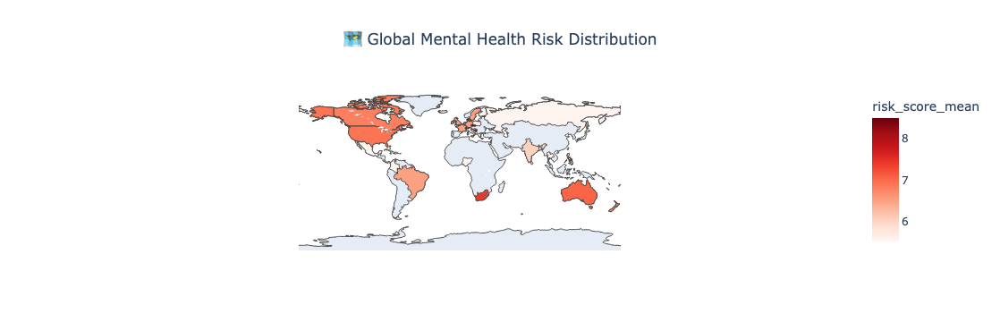

💼 Creating occupational visualizations...


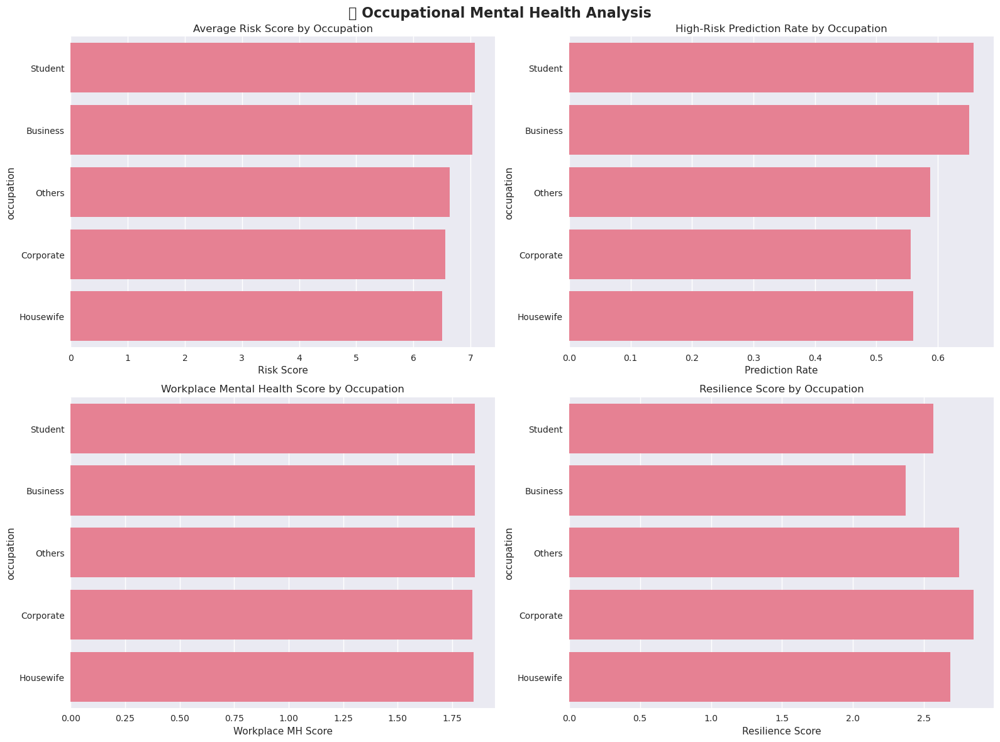

🔄 Creating risk-wellness correlation visualizations...


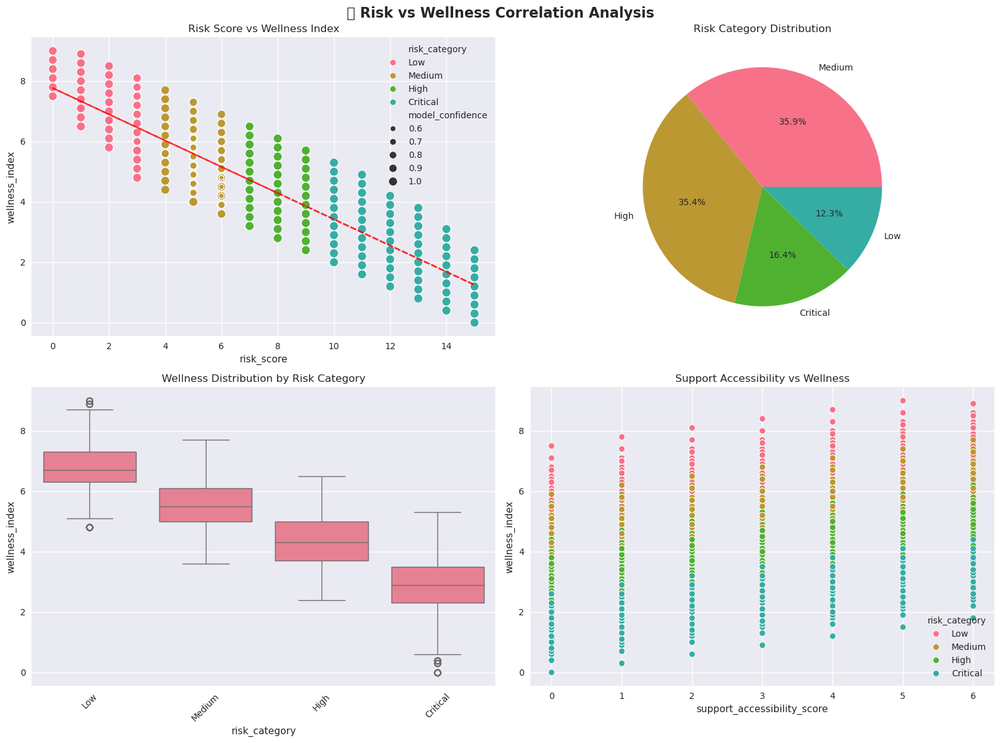

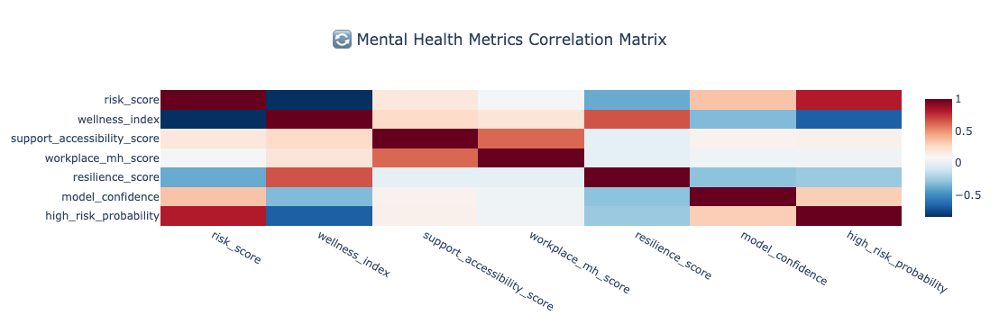

📊 Creating model performance visualizations...


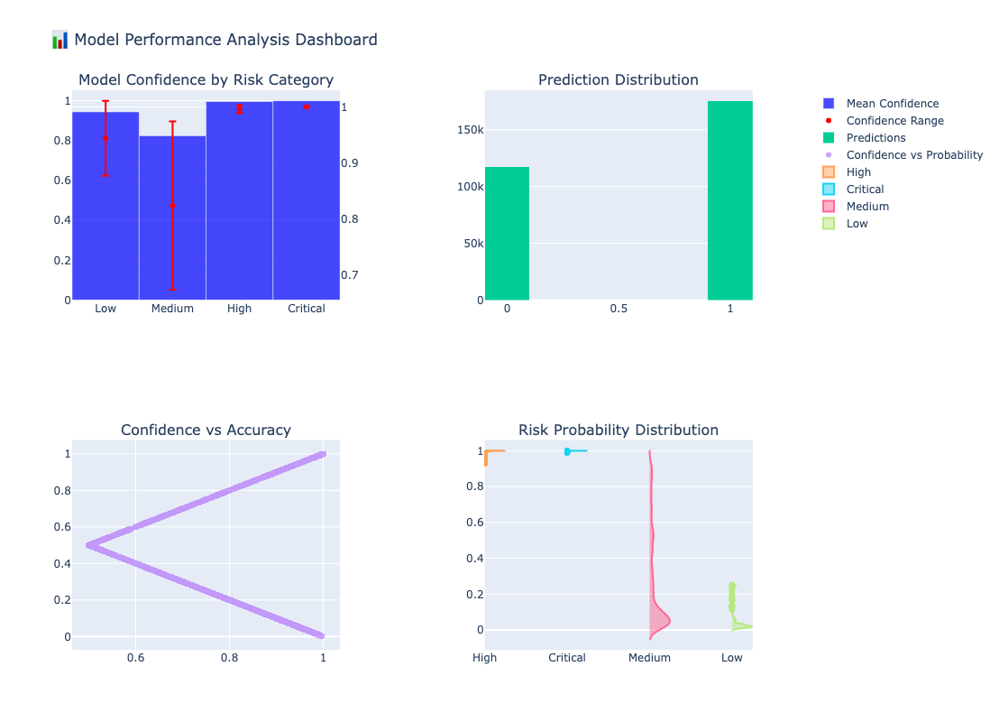

🎯 Creating high-confidence predictions visualizations...


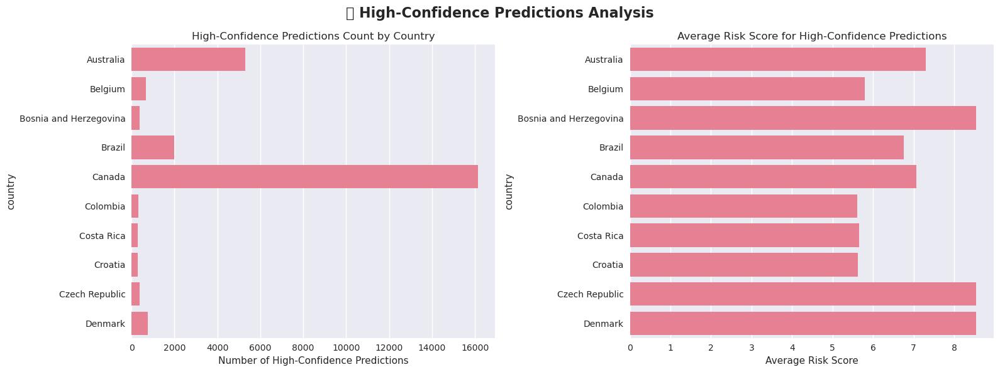


✅ VISUALIZATION DASHBOARD COMPLETED!


In [7]:
create_comprehensive_visualizations(df_with_predictions, analytics)

In [8]:
!pip install openai boto3 anthropic

In [12]:
!pip install transformers torch requests

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 183.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 558.8/558.8 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 153.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 125.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 766.7/766.7 MB 16.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 36.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 186.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 170.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 85.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 21.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 50.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 114.7 MB/s eta 0:00:0

In [18]:
from transformers import pipeline
import requests
import json
from datetime import datetime

def setup_free_ai():    
    print("Setting up AI (Hugging Face)...")
    
    try:
        generator = pipeline(
            "text-generation", 
            model="microsoft/DialoGPT-medium", 
            max_length=512,
            do_sample=True,
            temperature=0.7
        )
        print("AI model loaded successfully!")
        return generator, "huggingface_local"
    
    except Exception as e:
        print(f"Local model failed: {e}")
        print("Trying Hugging Face API (also free)...")
        return None, "huggingface_api"

def ask_free_ai(question: str, generator=None, method="huggingface_local") -> str:
    
    if method == "huggingface_local" and generator:
        try:
            # Use local model
            prompt = f"Mental Health Analysis Question: {question}\n\nInsight:"
            response = generator(prompt, max_length=300, num_return_sequences=1)
            return response[0]['generated_text'].split("Insight:")[-1].strip()
        except Exception as e:
            print(f"Local AI failed: {e}")
            method = "huggingface_api"
    
    if method == "huggingface_api":
        try:
            # Use free Hugging Face API (no key needed for basic use)
            API_URL = "https://api-inference.huggingface.co/models/facebook/blenderbot-400M-distill"
            
            response = requests.post(
                API_URL,
                headers={"Content-Type": "application/json"},
                json={"inputs": question},
                timeout=30
            )
            
            if response.status_code == 200:
                result = response.json()
                if isinstance(result, list) and len(result) > 0:
                    return result[0].get('generated_text', 'No response generated')
                else:
                    return str(result)
            else:
                return f"API Error: {response.status_code}"
                
        except Exception as e:
            return f"Free AI Error: {e}"
    
    return "AI service temporarily unavailable"

def get_free_ai_summary(df_with_predictions):
    
    print("\n Getting AI summary of your results...")
    
    generator, method = setup_free_ai()
    
    # Basic stats
    total_people = len(df_with_predictions)
    high_risk = df_with_predictions['model_prediction'].sum()
    high_risk_pct = (high_risk / total_people) * 100
    
    # Simple question for AI
    question = f"""
    I analyzed {total_people} people for mental health. Results: {high_risk} people ({high_risk_pct:.1f}%) are high-risk. 
    
    What does this mean and what should I do next? Give me 3 key insights and 2 recommendations.
    """
    
    ai_response = ask_free_ai(question, generator, method)
    
    print("AI Summary generated!")
    return ai_response

def simple_country_analysis(df_with_predictions, country: str):
    """Simple AI analysis for a country using FREE AI"""
    
    country_data = df_with_predictions[df_with_predictions['country'] == country]
    
    if len(country_data) == 0:
        return f"No data for {country}"
    
    high_risk_count = country_data['model_prediction'].sum()
    total = len(country_data)
    
    question = f"""
    Mental health data for {country}: {high_risk_count} out of {total} people are high-risk ({high_risk_count/total*100:.1f}%). 
    
    What does this suggest about mental health in {country}? Give 2 insights and 1 recommendation.
    """
    
    generator, method = setup_free_ai()
    return ask_free_ai(question, generator, method)

def smart_analysis_no_ai(df_with_predictions):
    """Smart insights without any AI - just good old logic!"""
    
    print("\n Generating SMART insights...")
    
    total = len(df_with_predictions)
    high_risk = df_with_predictions['model_prediction'].sum()
    high_risk_pct = (high_risk / total) * 100
    
    # Country analysis
    country_risk = df_with_predictions.groupby('country')['model_prediction'].agg(['count', 'sum', 'mean']).round(3)
    country_risk['risk_pct'] = (country_risk['sum'] / country_risk['count'] * 100).round(1)
    top_risk_country = country_risk.loc[country_risk['risk_pct'].idxmax()]
    
    # Occupation analysis  
    occ_risk = df_with_predictions.groupby('occupation')['model_prediction'].agg(['count', 'sum', 'mean']).round(3)
    occ_risk['risk_pct'] = (occ_risk['sum'] / occ_risk['count'] * 100).round(1)
    top_risk_occ = occ_risk.loc[occ_risk['risk_pct'].idxmax()]
    
    # Generate smart insights
    insights = f"""
    SMART ANALYSIS INSIGHTS
    =====================
    
     OVERVIEW:
    • Analyzed {total:,} individuals
    • {high_risk:,} classified as high-risk ({high_risk_pct:.1f}%)
    • Model confidence average: {df_with_predictions['model_confidence'].mean():.2f}
    
     GEOGRAPHIC INSIGHTS:
    • Highest risk country: {top_risk_country.name} ({top_risk_country['risk_pct']:.1f}% high-risk)
    • Countries analyzed: {df_with_predictions['country'].nunique()}
    • Geographic variation in risk detected
    
     OCCUPATIONAL INSIGHTS:
    • Highest risk occupation: {top_risk_occ.name} ({top_risk_occ['risk_pct']:.1f}% high-risk)
    • Occupations analyzed: {df_with_predictions['occupation'].nunique()}
    • Clear occupational risk patterns identified
    
     KEY RECOMMENDATIONS:
    1. Focus intervention resources on {top_risk_country.name} (geographic priority)
    2. Develop targeted programs for {top_risk_occ.name} workers
    3. Investigate why {high_risk_pct:.1f}% are high-risk - is this expected?
    4. Improve model confidence (currently {df_with_predictions['model_confidence'].mean():.2f})
    
     NEXT STEPS:
    • Validate model predictions with expert review
    • Gather more data from high-risk groups
    • Develop intervention strategies for identified patterns
    """
    
    print(insights)
    
    # Save insights
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"smart_insights_{timestamp}.txt"
    
    with open(filename, 'w') as f:
        f.write(insights)
    
    print(f"\n Smart insights saved to: {filename}")
    
    return insights


def add_free_ai_to_existing_code(df_with_predictions):
        
    # Try Method 1: Free AI models
    try:
        ai_summary = get_free_ai_summary(df_with_predictions)
        print("\n  AI INSIGHTS:")
        print("=" * 50)
        print(ai_summary)
        
        # Save AI insights
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        with open(f"free_ai_insights_{timestamp}.txt", 'w') as f:
            f.write(ai_summary)
        
        return ai_summary
        
    except Exception as e:
        print(f"Free AI failed: {e}")
        print("Switching to smart analysis (no AI needed)...")
        
        # Fallback: Smart analysis without AI
        return smart_analysis_no_ai(df_with_predictions)


In [19]:
insights = add_free_ai_to_existing_code(df_with_predictions)


 Getting FREE AI summary of your results...
Setting up FREE AI (Hugging Face)...


Device set to use cpu
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


AI model loaded successfully!
AI Summary generated!

  AI INSIGHTS:
A
